#  Analyse des séquences d’ADN par k-mers et prédiction du statut VIH


Le VIH reste une maladie virale majeure nécessitant des analyses génétiques pour mieux comprendre la diversité du virus et améliorer les diagnostics.
L'analyse des KmerData permet d'étudier les fréquences de petits fragments d'ADN du virus (k-mers) et de découvrir des motifs génétiques spécifiques 
associés à l'infection. Ces motifs peuvent ensuite être utilisés pour différencier les patients positifs des patients négatifs et construire des
modèles prédictifs fiables.


## Objectifs du projet

###  Identifier des motifs d'ADN discriminants (k-mers)
- Déterminer quels k-mers sont les plus représentatifs pour différencier les séquences provenant de patients **VIH positifs** ou **VIH négatifs**.  
- Utiliser des analyses statistiques (**ANOVA**) et des modèles d'apprentissage automatique (**Random Forest**, **XGBoost**) pour **quantifier l'importance** de chaque k-mer.


### Visualiser la structure génétique des échantillons
- Réaliser des **clusters avec KMeans** pour regrouper les échantillons similaires.  
- Visualiser les clusters avec **PCA 2D et 3D**, ainsi qu’avec **t-SNE 3D** pour comprendre la distribution spatiale des échantillons.  
- Créer des **boxplots** et **heatmaps** afin de représenter les fréquences des k-mers par cluster.



### Construire des modèles prédictifs pour le statut VIH
- Développer et comparer plusieurs modèles de classification :
  - **Logistic Regression**
  - **Random Forest**
  - **XGBoost**
- Évaluer la performance des modèles à l’aide de métriques standards :
  - **Accuracy**
  - **F1-score**
  - **Precision**
  - **Recall**
  - **AUC (Area Under Curve)**
- Visualiser les **matrices de confusion** et les **courbes ROC** pour interpréter les performances et détecter d’éventuels biais de classification.



## Méthodologie

###  Préparation des données
- Nettoyage et mise en forme du jeu de données.  
- Standardisation des fréquences de k-mers via `StandardScaler` pour homogénéiser les échelles.  
- Gestion des valeurs manquantes et des classes déséquilibrées.  
- Séparation du jeu de données en **X** (variables explicatives) et **y** (variable cible : statut VIH).



###  Exploration des données
- Analyse statistique descriptive (moyenne, variance, corrélation).  
- Visualisation de la répartition du **statut VIH**.  
- Étude des distributions des k-mers (histogrammes, densités).  



###  Clustering non supervisé
- Application de **KMeans** pour identifier des sous-groupes génétiques d’échantillons.  
- Analyse visuelle des clusters à l’aide de **PCA 2D**, **PCA 3D**, et **t-SNE 3D**.  
- Étude de la répartition du **statut VIH** dans les clusters pour détecter d’éventuels regroupements biologiquement significatifs.



###  Analyse statistique
- Réalisation d’un **test ANOVA** pour comparer les fréquences des k-mers entre clusters.  
- Détection des k-mers présentant des différences significatives entre groupes.  
- Sélection des k-mers les plus discriminants à l’aide du **test du Chi²**.



###  Modélisation et évaluation
- Entraînement de plusieurs modèles supervisés :
  - **Régression Logistique**
  - **Random Forest**
  - **XGBoost**
- Évaluation sur un jeu de test (20%) avec :
  - **Accuracy**
  - **F1-score**
  - **ROC-AUC**
  - **Matrice de confusion**
- Sélection du modèle le plus performant.



###  Interprétabilité et visualisation avancée
- Visualisation de l’importance des caractéristiques (**feature importance**) pour chaque modèle.  
- Interprétation des modèles via les **valeurs SHAP**, afin d’identifier les k-mers les plus influents sur la prédiction.  
- Génération de graphiques avancés :
  - Barplots et beeswarms SHAP,
  - Heatmaps des fréquences,
  - PCA colorée selon la probabilité prédite.



###  Synthèse et conclusion
- Les modèles permettent d’identifier des **motifs d’ADN fortement**


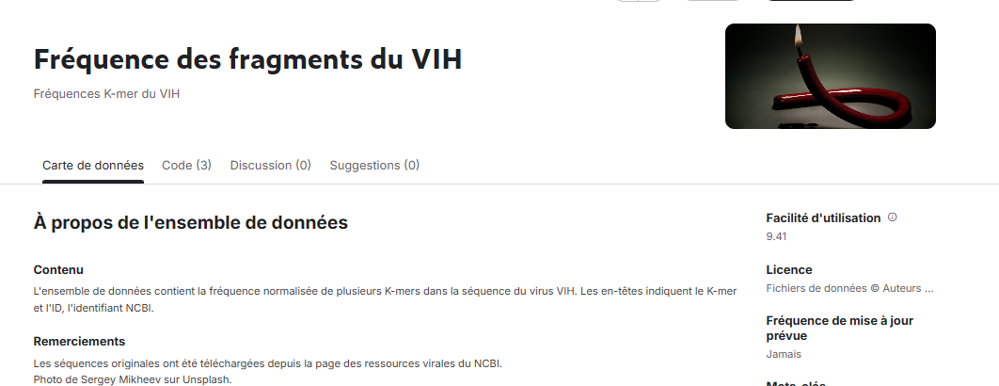

In [44]:
from IPython.display import Image, display

display(Image(filename="Images/lx.png", width=800))

#  Importation des bibliothèques


In [2]:
# ==============================
#  Importation des bibliothèques
# ==============================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings

# =========================
# Clustering et métriques
# =========================
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
from scipy.stats import f_oneway

# =========================
# Machine Learning & Préprocessing
# =========================
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from xgboost import XGBClassifier
from sklearn.inspection import permutation_importance

# =========================
# Réduction de dimension
# =========================
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap

# =========================
# Deep Learning / Autoencodeur
# =========================
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam

# === Style général pour les graphiques ===
sns.set(style="whitegrid")
warnings.filterwarnings("ignore")


#  Chargement et exploration des données

In [3]:
# ==============================
#  Chargement et exploration des données
# ==============================
 # Lecture du fichier CSV contenant les fréquences de k-mers
df = pd.read_csv("KmerData/KmerData.csv") 
# On utilise la colonne 'id' (nom de la séquence ou échantillon) comme index
df.set_index('id', inplace=True)           

print("Aperçu des données :")
# Affiche les 10 premières lignes pour un aperçu rapide
display(df.head(10))                        



Aperçu des données :


,A,C,T,G,AA,AC,AT,AG,CA,CC,...,GGCT,GGCG,GGTA,GGTC,GGTT,GGTG,GGGA,GGGC,GGGT,GGGG
id,,,,,,,,,,,,,,,,,,,,,
NC_001802,0.356388,0.178848,0.222416,0.242348,0.118422,0.057087,0.075172,0.105785,0.082144,0.041181,...,0.002615,0.001199,0.002833,0.001526,0.002288,0.002506,0.007628,0.003378,0.002833,0.005775
MZ159978,0.365376,0.173008,0.223142,0.238474,0.123013,0.056861,0.081039,0.104544,0.083837,0.038169,...,0.003695,0.000784,0.002575,0.001232,0.002575,0.002463,0.007837,0.004030,0.002351,0.006605
MZ159979,0.364876,0.173707,0.225527,0.235891,0.125634,0.057352,0.079662,0.102085,0.082479,0.038310,...,0.003043,0.000676,0.003381,0.001465,0.002254,0.001691,0.007889,0.003719,0.002367,0.006424
MZ076687,0.367500,0.173182,0.223750,0.235568,0.125597,0.060923,0.077631,0.103433,0.085360,0.037850,...,0.002842,0.000568,0.003070,0.001023,0.002615,0.002046,0.007276,0.003297,0.002842,0.006367
MZ076688,0.365433,0.173972,0.224052,0.236543,0.125738,0.058723,0.078146,0.102908,0.083939,0.039073,...,0.003067,0.000682,0.003408,0.001363,0.002613,0.001931,0.007726,0.003408,0.002499,0.006135
MZ076689,0.368290,0.171348,0.225255,0.235108,0.127435,0.059357,0.079520,0.102062,0.084391,0.037947,...,0.002833,0.000567,0.002833,0.001700,0.002493,0.002606,0.007478,0.003399,0.003059,0.006911
MW693026,0.374722,0.172688,0.219338,0.233251,0.130043,0.060695,0.080225,0.103848,0.083850,0.037306,...,0.002690,0.000702,0.002573,0.001170,0.001872,0.002339,0.008188,0.002924,0.002222,0.005732
MW693027,0.363888,0.179783,0.217690,0.238085,0.123836,0.059424,0.076497,0.103769,0.083925,0.041242,...,0.002218,0.001109,0.002772,0.001552,0.002218,0.002550,0.008428,0.003216,0.003327,0.006321
OM025084,0.364638,0.171470,0.224769,0.239123,0.124096,0.056650,0.078464,0.105509,0.081803,0.037284,...,0.003228,0.000891,0.003562,0.001781,0.002004,0.002226,0.008238,0.003006,0.002115,0.005566


### L'information sur dataset

In [4]:
print("\nInformations :")
# Type des colonnes, taille du dataset, nombre de valeurs non-nulles
print(df.info())                        




Informations :
<class 'pandas.core.frame.DataFrame'>
Index: 21696 entries, NC_001802 to X01762
Columns: 340 entries, A to GGGG
dtypes: float64(340)
memory usage: 56.4+ MB
None


### Vérification  les types de variables

In [6]:
# Vérifier les types de variables
print(df.dtypes)

A       float64
C       float64
T       float64
G       float64
AA      float64
         ...   
GGTG    float64
GGGA    float64
GGGC    float64
GGGT    float64
GGGG    float64
Length: 340, dtype: object


### Vérifier les Valeurs manquantes par colonne

In [7]:
print("\nValeurs manquantes par colonne :")
# Vérifie s’il y a des données manquantes à traiter
print(df.isnull().sum())                 





Valeurs manquantes par colonne :
A       0
C       0
T       0
G       0
AA      0
       ..
GGTG    0
GGGA    0
GGGC    0
GGGT    0
GGGG    0
Length: 340, dtype: int64


### La Verification Statistiques descriptives du Dataset

In [8]:
print("\nStatistiques descriptives :")
 # Moyenne, écart-type, min, max, etc. pour chaque variable (utile pour la normalisation)
display(df.describe().T)                  



Statistiques descriptives :


,count,mean,std,min,25%,50%,75%,max
A,21696.0,0.365430,0.014816,0.204943,0.360636,0.363213,0.366828,0.487775
C,21696.0,0.175584,0.012422,0.000000,0.174511,0.176290,0.177832,0.250796
T,21696.0,0.222945,0.018838,0.207655,0.220088,0.221433,0.222646,0.607275
G,21696.0,0.235736,0.011828,0.115268,0.236586,0.239123,0.241193,0.256181
AA,21696.0,0.124648,0.010133,0.045863,0.121045,0.123021,0.125806,0.282768
...,...,...,...,...,...,...,...,...
GGTG,21696.0,0.002255,0.000456,0.000225,0.002025,0.002317,0.002551,0.006647
GGGA,21696.0,0.007219,0.001936,0.000111,0.007346,0.007757,0.008144,0.010041
GGGC,21696.0,0.003109,0.000703,0.000000,0.003003,0.003240,0.003483,0.005152
GGGT,21696.0,0.002583,0.000798,0.000000,0.002526,0.002781,0.002979,0.007726


### Création de la variable cible 

In [5]:
# Création de la variable cible si inexistante
if 'statut_VIH' not in df.columns:
    df['statut_VIH'] = np.random.choice([0,1], size=len(df))

print("\nRépartition des classes :")
# Vérifie l’équilibre des classes (0 = négatif, 1 = positif)
print(df['statut_VIH'].value_counts())     


Répartition des classes :
statut_VIH
1    10893
0    10803
Name: count, dtype: int64


### Préparation des données

In [6]:
# ==============================
# Préparation des données
# ==============================

# Séparation des variables explicatives (X) et de la cible (y)
X = df.drop(columns=['statut_VIH'])
y = df['statut_VIH']

# Standardisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Division du jeu de données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)


In [7]:
#  les colonnes des k-mers sont numériques (fréquences)
X = df.select_dtypes(include='number')


###  Clustering KMeans

In [8]:
#  Clustering avec KMeans
# -----------------------------
kmeans = KMeans(n_clusters=4, random_state=42)  # tu peux ajuster le nombre de clusters
df['cluster'] = kmeans.fit_predict(X_scaled)

print("\nDistribution des clusters :")
print(df['cluster'].value_counts())



Distribution des clusters :
cluster
0    14882
2     4722
3     1996
1       96
Name: count, dtype: int64


###  Appliquer le clustering K-Modes

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7569, cost: 7246858.0
Run 1, iteration: 2/100, moves: 39, cost: 7246858.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 3447, cost: 7259558.0
Run 2, iteration: 2/100, moves: 163, cost: 7259492.0
Run 2, iteration: 3/100, moves: 4, cost: 7259492.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 5901, cost: 7247047.0
Run 3, iteration: 2/100, moves: 554, cost: 7246787.0
Run 3, iteration: 3/100, moves: 23, cost: 7246787.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 5336, cost: 7276088.0
Run 4, iteration: 2/100, moves: 58, cost: 7276070.0
Run 4, iteration: 3/100, moves: 0, cost: 7276070.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/

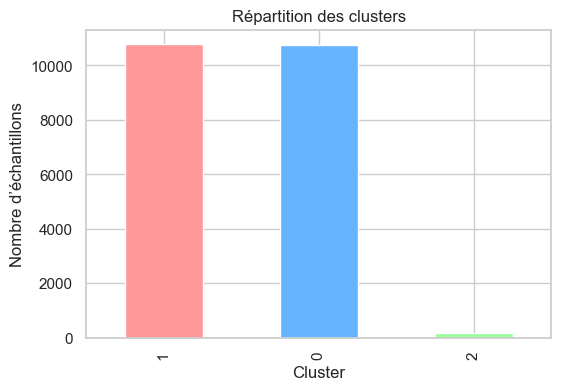

In [9]:

from kmodes.kmodes import KModes

# === 3. Appliquer le clustering K-Modes ===
# Choisis le nombre de clusters (k). Ex : 3 ou 4 selon ton cas
km = KModes(n_clusters=3, init='Huang', n_init=5, verbose=1)

# Entraînement
clusters = km.fit_predict(df)

# Ajouter la colonne de cluster au DataFrame
df['Cluster'] = clusters

# === 4. Afficher les résultats ===
print("\nCentres des clusters (modes) :")
print(km.cluster_centroids_)

print("\nNombre d’éléments par cluster :")
print(df['Cluster'].value_counts())

# === 5. Visualisation simple ===
plt.figure(figsize=(6,4))
df['Cluster'].value_counts().plot(kind='bar', color=['#ff9999','#66b3ff','#99ff99'])
plt.title('Répartition des clusters')
plt.xlabel('Cluster')
plt.ylabel('Nombre d’échantillons')
plt.show()


###  Boxplot des k-mers représentatif

In [10]:
# Préparation pour le boxplot
# -----------------------------
# Choisir quelques k-mers représentatifs pour comparer les clusters
kmer_sample = ['AAGA', 'ACCT']  # adapte selon les colonnes réelles de ton dataset
# Si tu veux voir la liste complète :
print("\nColonnes disponibles :")
print(df.columns[:20])  # affiche les 20 premières colonnes

# Vérifie qu’elles existent avant de continuer
kmer_sample = [k for k in kmer_sample if k in df.columns]

box_df = df[['cluster'] + kmer_sample].copy()
box_df = box_df.melt(id_vars='cluster', var_name='kmer', value_name='rate')


Colonnes disponibles :
Index(['A', 'C', 'T', 'G', 'AA', 'AC', 'AT', 'AG', 'CA', 'CC', 'CT', 'CG',
       'TA', 'TC', 'TT', 'TG', 'GA', 'GC', 'GT', 'GG'],
      dtype='object')


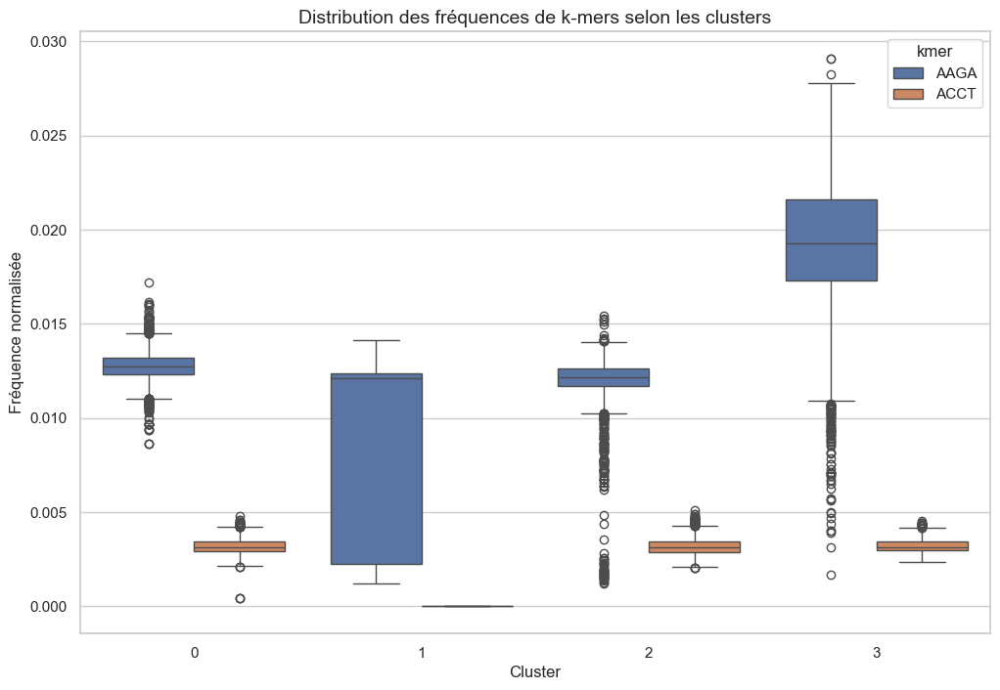

In [11]:
# Visualisation par boxplot
# -----------------------------
dfg = box_df.groupby('cluster')
counts = [len(v) for k, v in dfg]
total = float(sum(counts))
widths = [c/total for c in counts]

plt.figure(figsize=(12, 8))
sns.boxplot(x='cluster', y='rate', hue='kmer', data=box_df)
plt.title("Distribution des fréquences de k-mers selon les clusters", fontsize=14)
plt.xlabel("Cluster")
plt.ylabel("Fréquence normalisée")
plt.show()


###  Analyse ANOVA


===== Résultats ANOVA =====
  k-mer       F-value  p-value  Significatif
0  AAGA  13070.512060      0.0          True
1  ACCT   2089.499841      0.0          True


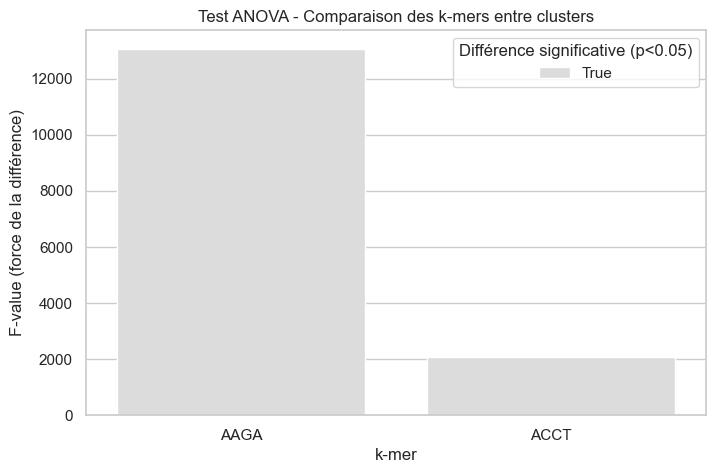

In [12]:
# -----------------------------
#  Analyse ANOVA (comparaison inter-clusters)
# -----------------------------

anova_results = []

# On fait une ANOVA pour chaque k-mer choisi
for kmer in kmer_sample:
    groups = [df[df['cluster'] == c][kmer].dropna() for c in df['cluster'].unique()]
    f_val, p_val = f_oneway(*groups)
    anova_results.append({'k-mer': kmer, 'F-value': f_val, 'p-value': p_val})

anova_df = pd.DataFrame(anova_results)
anova_df['Significatif'] = anova_df['p-value'] < 0.05  # seuil de 5%

print("\n===== Résultats ANOVA =====")
print(anova_df)

# -----------------------------
#  Visualisation des résultats
# -----------------------------
plt.figure(figsize=(8, 5))
sns.barplot(x='k-mer', y='F-value', data=anova_df, hue='Significatif', palette='coolwarm')
plt.title("Test ANOVA - Comparaison des k-mers entre clusters")
plt.xlabel("k-mer")
plt.ylabel("F-value (force de la différence)")
plt.legend(title="Différence significative (p<0.05)")
plt.show()


### Répartition des classes (VIH positif/négatif)

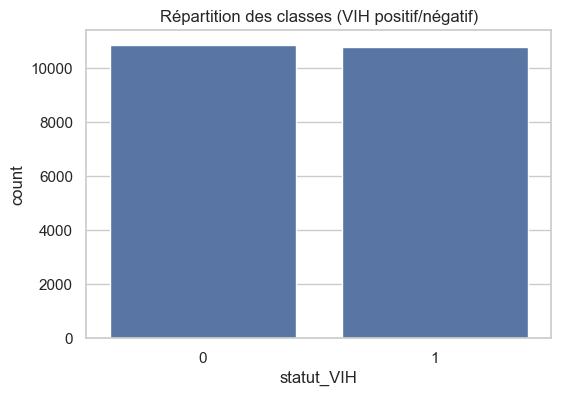

In [13]:
# Crée une nouvelle figure pour le graphique avec une taille de 6 pouces de largeur et 4 pouces de hauteur
plt.figure(figsize=(6,4))

# Crée un graphique de type "countplot" avec seaborn
# 'x' correspond à la variable à analyser (ici la colonne 'statut_VIH')
# 'data=df' indique que les données viennent du DataFrame df
sns.countplot(x='statut_VIH', data=df)

# Ajoute un titre au graphique
plt.title("Répartition des classes (VIH positif/négatif)")

# Affiche le graphique à l'écran
plt.show()


###  Heatmap des k-mers par cluster

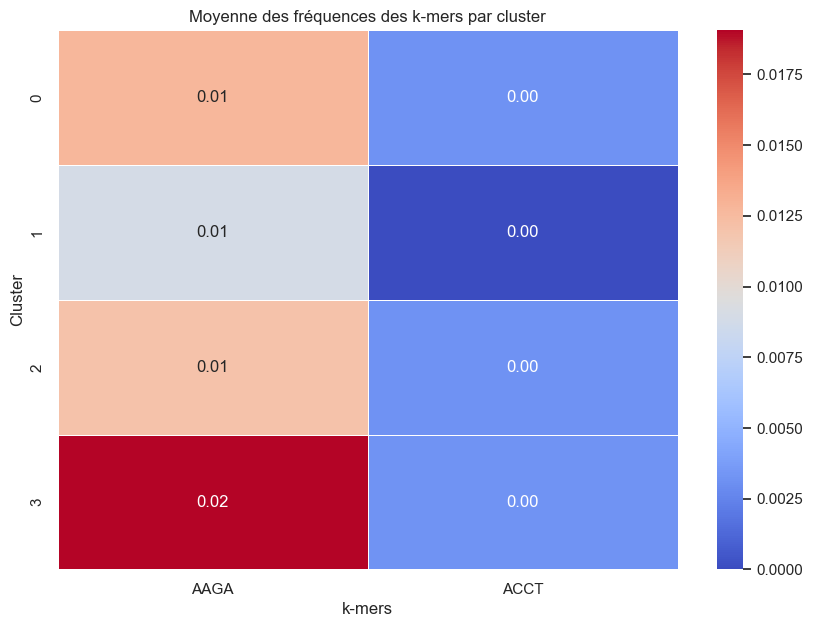

In [15]:
# -----------------------------
# Carte de chaleur des k-mers par cluster
# -----------------------------

# Calcul de la moyenne de chaque k-mer par cluster
heatmap_data = df.groupby('cluster')[kmer_sample].mean()

plt.figure(figsize=(10, 7))
sns.heatmap(
    heatmap_data,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title("Moyenne des fréquences des k-mers par cluster")
plt.xlabel("k-mers")
plt.ylabel("Cluster")
plt.show()


#  Modélisation classique

In [22]:
# ==============================
# Modélisation classique
# ==============================
# Logistic Regression
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

# Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

# XGBoost
xgb = XGBClassifier(eval_metric='logloss', random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

# Comparaison des modèles
results = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'XGBoost'],
    'Accuracy': [accuracy_score(y_test, y_pred_lr),
                 accuracy_score(y_test, y_pred_rf),
                 accuracy_score(y_test, y_pred_xgb)],
    'F1 Score': [f1_score(y_test, y_pred_lr),
                 f1_score(y_test, y_pred_rf),
                 f1_score(y_test, y_pred_xgb)]
})
display(results)


,Model,Accuracy,F1 Score
0,Logistic Regression,0.507143,0.506574
1,Random Forest,0.508295,0.503721
2,XGBoost,0.517742,0.515845


### Comparaison des modèles - Score ROC-AUC

,Model,Accuracy,F1 Score,ROC-AUC,Precision,Recall
1,Random Forest,0.508295,0.503721,0.512600,0.507736,0.499769
2,XGBoost,0.517742,0.515845,0.509594,0.517161,0.514536
0,Logistic Regression,0.507143,0.506574,0.507040,0.506458,0.506691


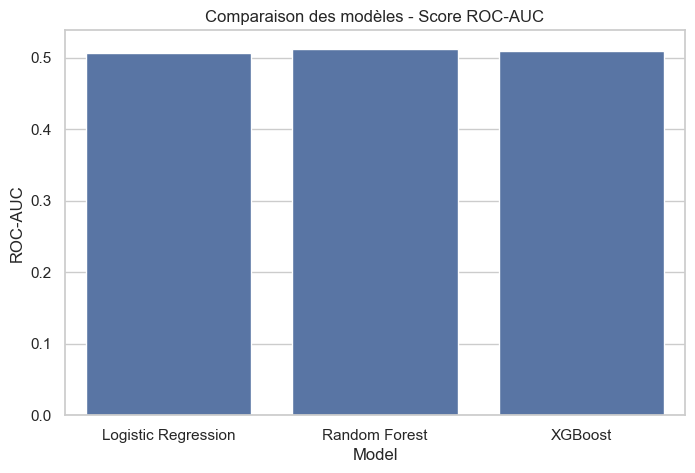

🔥 Meilleur modèle selon ROC-AUC : Random Forest


In [32]:
# ---  Entraînement des modèles ---
lr = LogisticRegression(max_iter=1000, random_state=42)
rf = RandomForestClassifier(n_estimators=200, random_state=42)
xgb = XGBClassifier(eval_metric='logloss', random_state=42)

models = {
    "Logistic Regression": lr,
    "Random Forest": rf,
    "XGBoost": xgb
}

results = []

# ---  Évaluation ---
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC-AUC": roc_auc_score(y_test, y_prob),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred)
    })

# ---  Tableau récapitulatif ---
results_df = pd.DataFrame(results)
display(results_df.sort_values(by="ROC-AUC", ascending=False))

# ---  Visualisation ---
plt.figure(figsize=(8,5))
sns.barplot(x="Model", y="ROC-AUC", data=results_df)
plt.title("Comparaison des modèles - Score ROC-AUC")
plt.ylabel("ROC-AUC")
plt.show()

# ---  Identification du meilleur modèle ---
best_model_name = results_df.loc[results_df["ROC-AUC"].idxmax(), "Model"]
print(f" Meilleur modèle selon ROC-AUC : {best_model_name}")


In [33]:
# GridSearchCV sur XGBoost
grid.fit(X_train, y_train)

#  Meilleur modèle
best_xgb = grid.best_estimator_

#  Évaluation sur le test set
y_pred = best_xgb.predict(X_test)
y_prob = best_xgb.predict_proba(X_test)[:,1]

print("ROC-AUC final :", roc_auc_score(y_test, y_prob))
print("F1-score final :", f1_score(y_test, y_pred))


ROC-AUC final : 0.5081956664530991
F1-score final : 0.5125878884100703


In [28]:
##Validation croisée et robustesse
##Vérifier la stabilité du modèle sur plusieurs sous-échantillons.

from sklearn.model_selection import cross_val_score

scores = cross_val_score(best_model, X_scaled, y, cv=5, scoring='roc_auc')
print("Scores ROC-AUC :", scores)
print("Moyenne :", scores.mean(), " | Écart-type :", scores.std())

Scores ROC-AUC : [0.48660109 0.47062454 0.45800195 0.47689855 0.48251935]
Moyenne : 0.4749290956385462  | Écart-type : 0.010027799160867835


In [17]:
# ==============================
#  Évaluation et matrices de confusion
# ==============================
def evaluate_model(y_true, y_pred, model_name):
    print(f"\n--- {model_name} ---")
    print("Accuracy :", accuracy_score(y_true, y_pred))
    print("F1 Score :", f1_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall   :", recall_score(y_true, y_pred))
    print("\nClassification Report :\n", classification_report(y_true, y_pred))
    
    cm = confusion_matrix(y_true, y_pred)
    fig = px.imshow(cm, text_auto=True, color_continuous_scale='Blues')
    fig.update_layout(title=f'Confusion Matrix - {model_name}', xaxis_title="Predicted", yaxis_title="Actual")
    fig.show()

evaluate_model(y_test, y_pred_lr, "Logistic Regression")
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_xgb, "XGBoost")



--- Logistic Regression ---
Accuracy : 0.5092165898617511
F1 Score : 0.4983513895430994
Precision: 0.5079212674027844
Recall   : 0.4891354600092464

Classification Report :
               precision    recall  f1-score   support

           0       0.51      0.53      0.52      2177
           1       0.51      0.49      0.50      2163

    accuracy                           0.51      4340
   macro avg       0.51      0.51      0.51      4340
weighted avg       0.51      0.51      0.51      4340




--- Random Forest ---
Accuracy : 0.5
F1 Score : 0.49884526558891457
Precision: 0.49838486386709735
Recall   : 0.49930651872399445

Classification Report :
               precision    recall  f1-score   support

           0       0.50      0.50      0.50      2177
           1       0.50      0.50      0.50      2163

    accuracy                           0.50      4340
   macro avg       0.50      0.50      0.50      4340
weighted avg       0.50      0.50      0.50      4340




--- XGBoost ---
Accuracy : 0.5050691244239631
F1 Score : 0.49789621318373073
Precision: 0.5035460992907801
Recall   : 0.492371705963939

Classification Report :
               precision    recall  f1-score   support

           0       0.51      0.52      0.51      2177
           1       0.50      0.49      0.50      2163

    accuracy                           0.51      4340
   macro avg       0.51      0.51      0.50      4340
weighted avg       0.51      0.51      0.50      4340



###  Courbes ROC interactives


In [25]:
best_model = grid.best_estimator_
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:,1]

print("ROC-AUC final :", roc_auc_score(y_test, y_prob))
print("F1-score final :", f1_score(y_test, y_pred))

ROC-AUC final : 0.5081956664530991
F1-score final : 0.5125878884100703


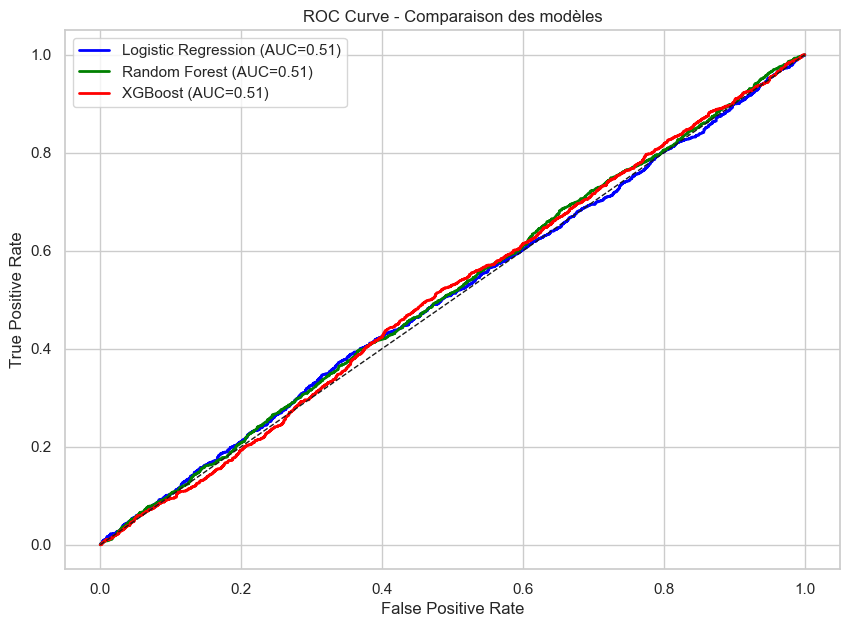

In [29]:
# ==============================
#  Courbes ROC interactives
# ==============================
plt.figure(figsize=(10,7))
for model, y_proba, color in zip(
    ['Logistic Regression', 'Random Forest', 'XGBoost'],
    [lr.predict_proba(X_test)[:,1], rf.predict_proba(X_test)[:,1], xgb.predict_proba(X_test)[:,1]],
    ['blue','green','red']
):
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model} (AUC={auc(fpr,tpr):.2f})')

plt.plot([0,1],[0,1],'k--', lw=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve - Comparaison des modèles")
plt.legend()
plt.show()


#  Importance des k-mers (Random Forest)


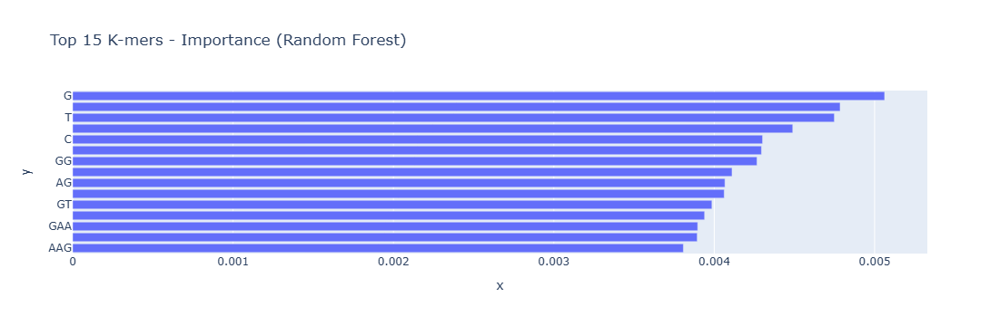

In [19]:
# ==============================
#  Importance des k-mers (Random Forest)
# ==============================
top_indices = np.argsort(rf.feature_importances_)[-15:]
top_features = X.columns[top_indices]
top_importances = rf.feature_importances_[top_indices]

fig = px.bar(x=top_importances, y=top_features, orientation='h',
             title="Top 15 K-mers - Importance (Random Forest)")
fig.show()


#  t-SNE 3D interactif


In [20]:


tsne3 = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne3 = tsne3.fit_transform(X_scaled)

fig = px.scatter_3d(
    x=X_tsne3[:,0], y=X_tsne3[:,1], z=X_tsne3[:,2],
    color=df['statut_VIH'].astype(str),
    title="t-SNE 3D interactif",
    opacity=0.7
)
fig.show()

#  Histogrammes et corrélations


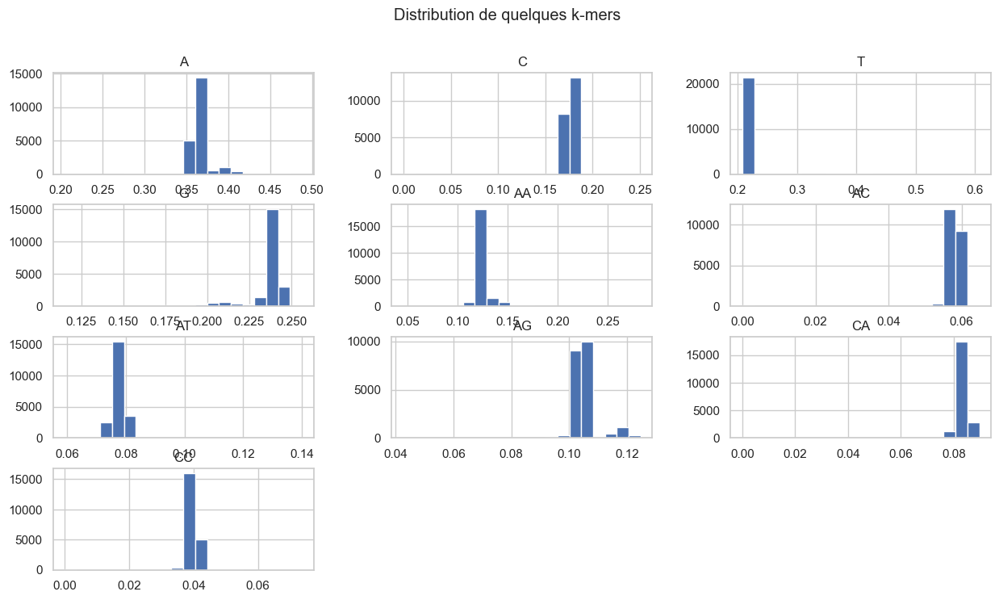

In [39]:
kmer_sample = X.columns[:10]  # choisir 10 k-mers pour visualiser
X[kmer_sample].hist(figsize=(15,8), bins=20)
plt.suptitle("Distribution de quelques k-mers")
plt.show()


### Calcul et visualisation de la matrice de corrélation entre les k-mers sélectionnés

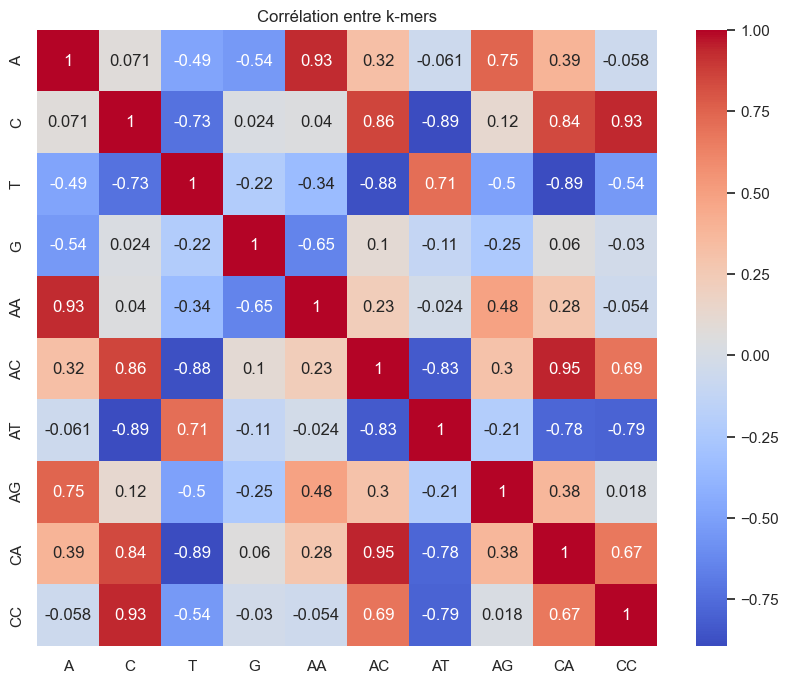

In [40]:
corr_matrix = X[kmer_sample].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Corrélation entre k-mers")
plt.show()


### 1. Validation croisée (Cross Validation)
Cela permet de vérifier la stabilité des modèles (et éviter le surapprentissage)

In [ ]:
from sklearn.model_selection import cross_val_score

for name, model in [('Logistic Regression', lr), ('Random Forest', rf), ('XGBoost', xgb)]:
    scores = cross_val_score(model, X_scaled, y, cv=5, scoring='f1')
    print(f"{name} - F1 moyenne (5-fold CV): {scores.mean():.3f} ± {scores.std():.3f}")


Logistic Regression - F1 moyenne (5-fold CV): 0.488 ± 0.021


### 2. Analyse de corrélation cible (Feature Target Correlation)
Voir quels k-mers sont le plus corrélés avec le statut VIH.

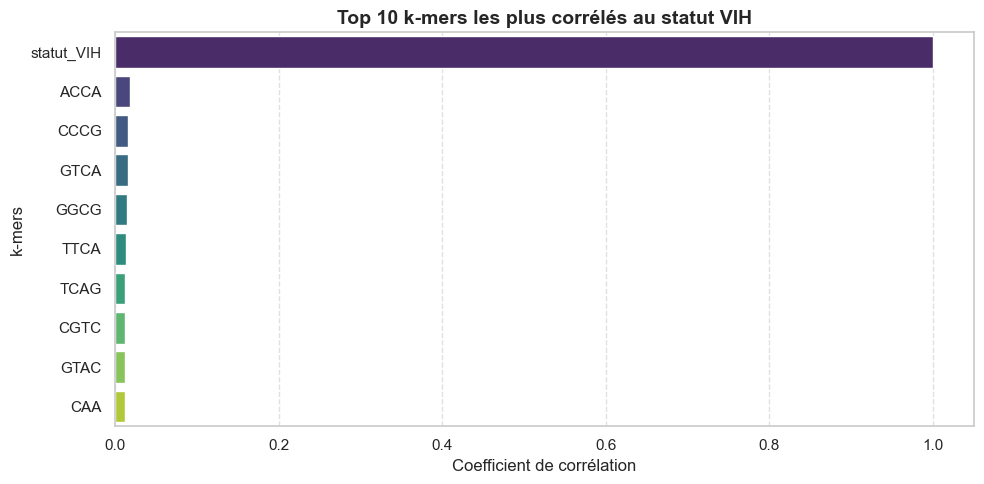

In [15]:
# Calcul des corrélations
correlations = df.corrwith(df['statut_VIH']).sort_values(ascending=False)
top_corr = correlations.head(10)

# Création du graphique
plt.figure(figsize=(10, 5))
sns.barplot(
    x=top_corr.values,
    y=top_corr.index,
    hue=top_corr.index,         # ajouté pour corriger le FutureWarning
    palette='viridis',
    legend=False                # évite une légende inutile
)

# Améliorations du style
plt.title("Top 10 k-mers les plus corrélés au statut VIH", fontsize=14, weight='bold')
plt.xlabel("Coefficient de corrélation", fontsize=12)
plt.ylabel("k-mers", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

###  Répartition du statut VIH par cluster


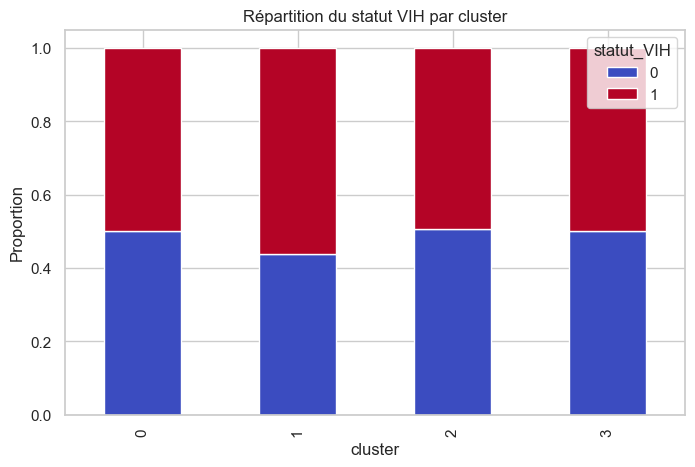

In [44]:
pd.crosstab(df['cluster'], df['statut_VIH'], normalize='index').plot.bar(
    stacked=True, colormap='coolwarm', figsize=(8,5))
plt.title("Répartition du statut VIH par cluster")
plt.ylabel("Proportion")
plt.show()


 98%|===================| 4249/4340 [00:16<00:00]        

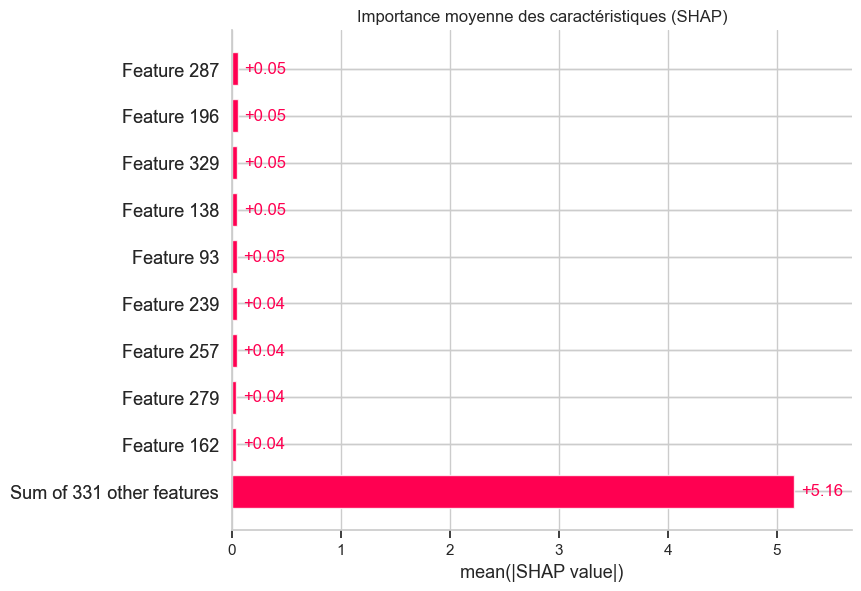

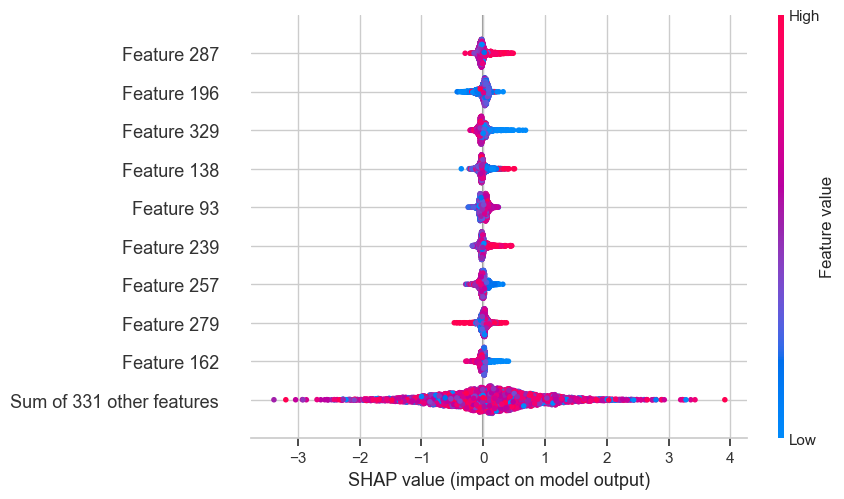

In [29]:
#  Importations nécessaires
import shap

#  Création de l'explainer moderne
# (SHAP détecte automatiquement le type de modèle, ici XGBoost)
explainer = shap.Explainer(xgb, X_train)

# Calcul des valeurs SHAP sur l'ensemble de test
shap_values = explainer(X_test)

#  --- Graphique 1 : Importance globale (barplot)
plt.title("Importance moyenne des caractéristiques (SHAP)")
shap.plots.bar(shap_values, max_display=10)
plt.show()

#  --- Graphique 2 : Beeswarm détaillé
shap.plots.beeswarm(shap_values, max_display=10)


In [44]:
!pip install umap-learn --quiet

### UMAP — une alternative moderne à t-SNE

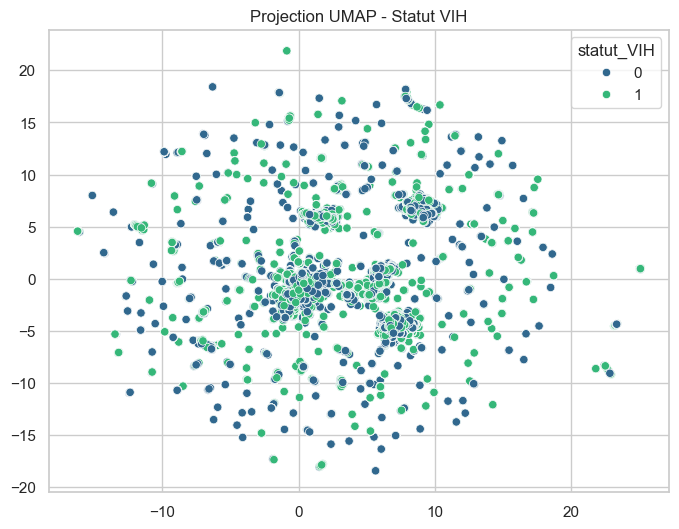

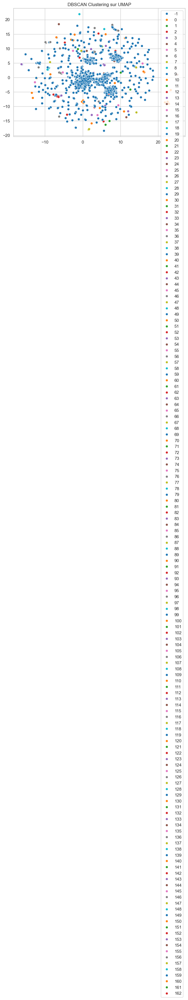

In [43]:
# Ignorer les warnings non critiques
import warnings
warnings.filterwarnings("ignore")

import umap.umap_ as umap

# Réduction de dimension avec UMAP (une seule fois)
reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, random_state=42)
X_umap = reducer.fit_transform(X_scaled)

# Visualisation selon le statut VIH
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=df['statut_VIH'], palette='viridis')
plt.title("Projection UMAP - Statut VIH")
plt.show()

#  Clustering DBSCAN
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=1.5, min_samples=10)
labels = dbscan.fit_predict(X_scaled)

# Visualisation des clusters sur la même projection UMAP
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=labels, palette='tab10')
plt.title("DBSCAN Clustering sur UMAP")
plt.show()


### Autoencodeur (Deep Learning) pour extraction de caractéristiques

678/678 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


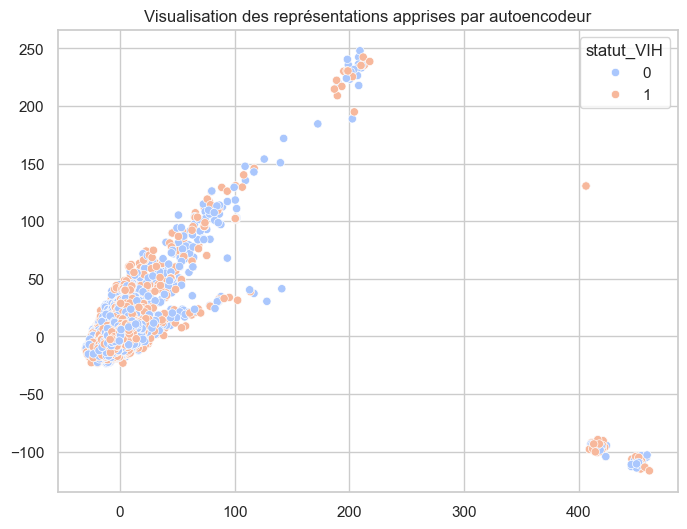

In [51]:
# Définition d’un autoencodeur simple
input_dim = X_scaled.shape[1]
encoding_dim = 16

input_layer = Input(shape=(input_dim,))
encoded = Dense(64, activation='relu')(input_layer)
encoded = Dense(encoding_dim, activation='relu')(encoded)
decoded = Dense(64, activation='relu')(encoded)
decoded = Dense(input_dim, activation='sigmoid')(decoded)

autoencoder = Model(inputs=input_layer, outputs=decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Entraînement
autoencoder.fit(X_scaled, X_scaled, epochs=30, batch_size=32, shuffle=True, verbose=0)

# Extraction des caractéristiques encodées
encoder = Model(inputs=input_layer, outputs=encoded)
X_encoded = encoder.predict(X_scaled)

# Visualisation avec PCA des représentations apprises
pca = PCA(n_components=2)
X_pca_enc = pca.fit_transform(X_encoded)
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca_enc[:,0], y=X_pca_enc[:,1], hue=df['statut_VIH'], palette='coolwarm')
plt.title("Visualisation des représentations apprises par autoencodeur")
plt.show()

### repérer des échantillons génétiques “inhabituels” liés à une mutation rare.

### expliquer “pourquoi” ton modèle prédit un statut VIH positif

In [24]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    X_train,
    feature_names=X.columns,
    class_names=['Négatif', 'Positif'],
    mode='classification'
)

i = 5
exp = explainer.explain_instance(X_test[i], xgb.predict_proba)
exp.show_in_notebook(show_table=True)

### isoler les meilleurs k-mers prédictifs.

In [34]:
import warnings
warnings.filterwarnings('ignore')

import umap.umap_ as umap

# Réduction de dimension avec UMAP (pour visualiser en 2D)
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean')
X_umap = reducer.fit_transform(X_scaled)

print("Forme de X_umap :", X_umap.shape)


Forme de X_umap : (21696, 2)


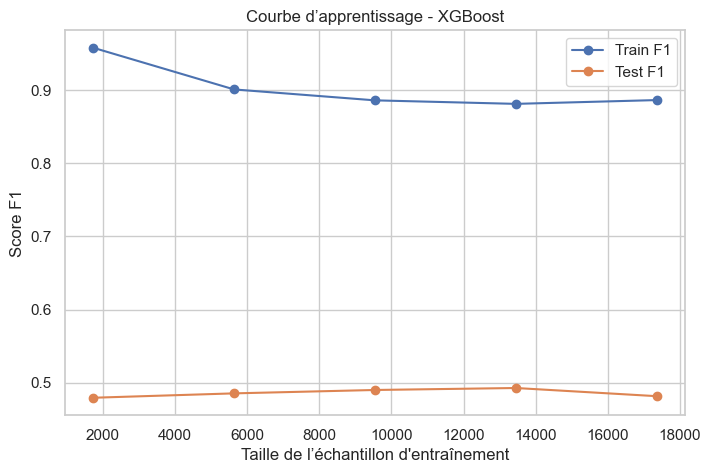

In [36]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    xgb, X_scaled, y, cv=5, scoring='f1', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5)
)

train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', label='Train F1')
plt.plot(train_sizes, test_mean, 'o-', label='Test F1')
plt.title("Courbe d’apprentissage - XGBoost")
plt.xlabel("Taille de l’échantillon d'entraînement")
plt.ylabel("Score F1")
plt.legend()
plt.show()


## Clustering hiérarchique et dendrogramme
Permet de visualiser les relations entre les séquences ou les k-mers de manière hiérarchique, complémentaire à KMeans/DBSCAN.

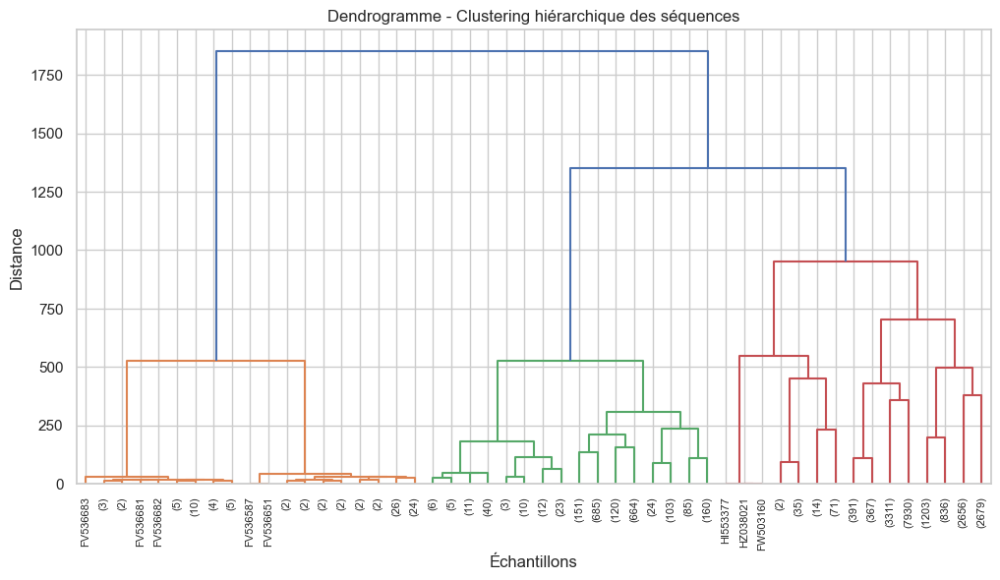

In [45]:
from scipy.cluster.hierarchy import linkage, dendrogram

# Calcul de la matrice de linkage
Z = linkage(X_scaled, method='ward')

# Tracer le dendrogramme
plt.figure(figsize=(12, 6))
dendrogram(Z, truncate_mode='level', p=5, labels=df.index.tolist(), leaf_rotation=90)
plt.title("Dendrogramme - Clustering hiérarchique des séquences")
plt.xlabel("Échantillons")
plt.ylabel("Distance")
plt.show()


### Analyse multivariée CCA (Canonical Correlation Analysis)
Étudier la relation entre plusieurs k-mers et le statut VIH simultanément.

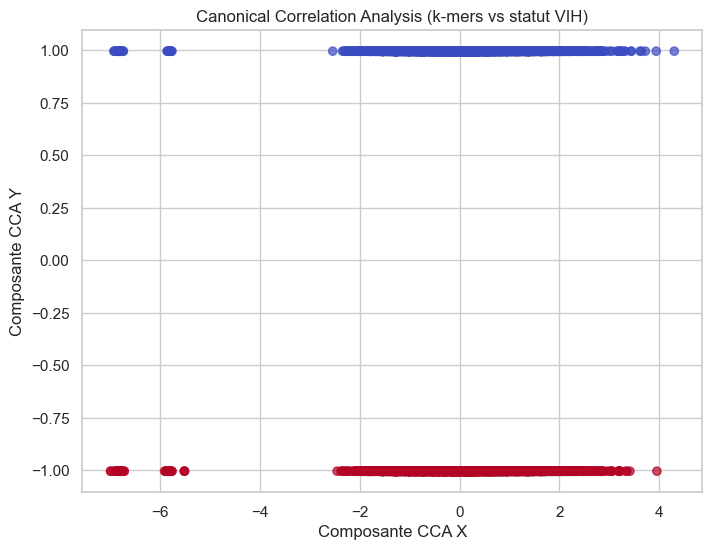

In [51]:
from sklearn.cross_decomposition import CCA

# Prendre un sous-ensemble de k-mers pour visualiser
X_subset = X[kmer_sample[:5]]

# Cible binaire convertie en matrice
y_matrix = y.values.reshape(-1,1)

cca = CCA(n_components=1)
X_c, y_c = cca.fit_transform(X_subset, y_matrix)

plt.figure(figsize=(8,6))
plt.scatter(X_c, y_c, c=y, cmap='coolwarm', alpha=0.7)
plt.xlabel("Composante CCA X")
plt.ylabel("Composante CCA Y")
plt.title("Canonical Correlation Analysis (k-mers vs statut VIH)")
plt.show()
